# INFO2049 Image Captioning (NLP + Vision) - December 2025

- Camille Trinh s192024
- Lei Yang s201670
- Simon Gardier s192580

## Imports

In [2]:
print("import started")
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
import ssl
import sys
ssl._create_default_https_context = ssl._create_unverified_context
from torch.utils.data import Dataset
from transformers import AutoTokenizer
from torchvision import transforms, models
from textwrap import wrap
from matplotlib.ticker import MaxNLocator
from tqdm import tqdm
from PIL import Image
from transformers import GPT2Tokenizer
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from nltk.translate.bleu_score import corpus_bleu
print("import halfway")
import pandas as pd
import matplotlib.pyplot as plt
import torch.utils.data as data
import torch.optim as optim
import torch.nn as nn
import torch
import itertools
import json
import ast
print("import finished")


import started


2025-12-04 15:04:49.421616: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1764860689.440456  110934 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1764860689.446702  110934 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1764860689.461393  110934 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1764860689.461414  110934 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1764860689.461416  110934 computation_placer.cc:177] computation placer alr

import halfway
import finished


## Utils

In [62]:
def load_image(image_path):
    image = Image.open(image_path).convert('RGB')
    return image


def show_image(image, title=None):
    plt.imshow(image)
    if title:
        plt.title("\n".join(wrap(title, 60)))
    plt.axis('off')
    plt.show()


def show_image_with_label(df, path_image_folder):
    for i in range(len(df)):
        image_name = df.iloc[i]['image']
        caption = df.iloc[i]['caption']
        image_path = os.path.join(path_image_folder, image_name)
        image = load_image(image_path)
        show_image(image, title=caption)


def analyze_image_splits(df):
    total_unique = df['image'].nunique()
    print(f"Total Unique Images: {total_unique}")

    split_counts = df.groupby('split')['image'].nunique()
    print(split_counts)

    if split_counts.sum() != total_unique:
        print(
            f"(WARNING: Sum of splits {split_counts.sum()} != Total images {total_unique})")

    splits = df['split'].unique()
    split_img_sets = {s: set(df[df['split'] == s]['image']) for s in splits}

    leaks_found = False
    for s1, s2 in itertools.combinations(splits, 2):
        intersection = split_img_sets[s1].intersection(split_img_sets[s2])
        if len(intersection) > 0:
            print(
                f"WARNING: Found {len(intersection)} images appearing in both '{s1}' and '{s2}'")
            leaks_found = True


def load_karpathy_dataframe(json_path, image_folder_path):
    with open(json_path, 'r') as f:
        data = json.load(f)
    rows = []
    for img_item in data['images']:
        filename = img_item['filename']
        split = img_item['split']
        for sentence in img_item['sentences']:
            caption = sentence['raw']
            rows.append({
                'image': filename,
                'image_path': os.path.join(image_folder_path, filename),
                'caption': caption.replace('\n', ' ').replace('\r', ' ').strip(),
                'split': split
            })

    return pd.DataFrame(rows)


class FlickrDataset(Dataset):
    def __init__(self, df, root, tokenizer, transform, max_length=30):
        super().__init__()
        self.df = df
        self.root = root
        self.transform = transform
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        image_name = self.df.iloc[idx]['image']
        caption_text = self.df.iloc[idx]['caption']
        image_path = os.path.join(self.root, image_name)
        try:
            image = load_image(image_path)
        except Exception as e:
            sys.exit(f"Error loading image {image_path}: {e}")

        if self.transform:
            image = self.transform(image)

        encoded = self.tokenizer.encode_plus(
            caption_text,
            add_special_tokens=True,
            max_length=self.max_length,
            padding='max_length',
            truncation=True,
            return_tensors='pt'
        )

        caption = encoded['input_ids'].squeeze(0)

        # All except last token
        input_ids = caption[:-1]
        # All except first token
        target_ids = caption[1:]

        return image, input_ids, target_ids


class SimpleTokenizer:
    def __init__(self, texts, max_len=30):
        self.tk = Tokenizer(oov_token="<unk>", filters='!"#$%&()*+,-./:;=?@[\\]^_`{|}~\t\n')
        self.tk.fit_on_texts([f"<start> {t} <end>" for t in texts])
        self.vocab_size = len(self.tk.word_index) + 1
        self.cls_token_id = self.tk.word_index["<start>"]
        self.sep_token_id = self.tk.word_index["<end>"]
        self.pad_token_id = 0
        self.max_len = max_len

    def encode_plus(self, text, **kwargs):
        seq = self.tk.texts_to_sequences([f"<start> {text} <end>"])
        seq = pad_sequences(seq, maxlen=self.max_len, padding='post', truncating='post')[0]
        return {'input_ids': torch.tensor(seq, dtype=torch.long).unsqueeze(0)}

    def decode(self, ids, skip_special_tokens=False):
        ids = ids.tolist() if torch.is_tensor(ids) else ids
        ids = [i for i in ids if i != 0]
        text = self.tk.sequences_to_texts([ids])[0]
        if skip_special_tokens:
            return text.replace("<start>", "").replace("<end>", "").replace("<unk>", "").strip()
        return text


def train(df, images_folder, save_folder, model, tokenizer, optimizer, criterion, device, num_epochs=20, batch_size=128, num_workers=4, file_prefix="epoch"):
    print(
        f"Training on {num_epochs} epochs, batch size = {batch_size}, num_workers = {num_workers}, save_folder = {save_folder}, file_prefix = {file_prefix}")
    train_loader = data.DataLoader(FlickrDataset(df[df['split'] == 'train'].reset_index(
        drop=True), images_folder, tokenizer, transform=image_transform), batch_size=batch_size, shuffle=True, num_workers=num_workers)
    valid_loader = data.DataLoader(FlickrDataset(df[df['split'] == 'val'].reset_index(
        drop=True), images_folder, tokenizer, transform=image_transform), batch_size=batch_size, shuffle=True, num_workers=num_workers)

    array_loss_train = []
    array_loss_valid = []
    best_valid_loss = float('inf')
    for epoch in range(num_epochs):
        model.train()
        train_loss = 0
        for images, input_ids, target_ids in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} - Training"):
            images = images.to(device)
            input_ids = input_ids.to(device)
            target_ids = target_ids.to(device)

            outputs = model(images, input_ids)

            loss = criterion(
                outputs.view(-1, tokenizer.vocab_size), target_ids.view(-1))
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            train_loss += loss.item()

        avg_train_loss = train_loss / len(train_loader)
        array_loss_train.append(avg_train_loss)
        print(
            f"Epoch {epoch+1}/{num_epochs} - Training Loss: {avg_train_loss:.4f}")

        model.eval()
        total_valid_loss = 0
        for images, input_ids, target_ids in tqdm(valid_loader, desc=f"Epoch {epoch+1}/{num_epochs} - Validation"):
            images = images.to(device)
            input_ids = input_ids.to(device)
            target_ids = target_ids.to(device)

            with torch.no_grad():
                outputs = model(images, input_ids)
                loss = criterion(
                    outputs.view(-1, tokenizer.vocab_size), target_ids.view(-1))
                total_valid_loss += loss.item()

        avg_valid_loss = total_valid_loss / len(valid_loader)
        print(
            f"Epoch {epoch+1}/{num_epochs} - Validation Loss: {avg_valid_loss:.4f}")
        array_loss_valid.append(avg_valid_loss)

        if avg_valid_loss < best_valid_loss:
            best_valid_loss = avg_valid_loss
            save_path = os.path.join(save_folder, f'{file_prefix}_{epoch+1}.pth')
            torch.save(model.state_dict(), save_path)
            print(f"Model saved to {save_path}")

    return array_loss_train, array_loss_valid


def load_model(path, model):
    state_dict = torch.load(path, map_location=device)
    new_state_dict = {}
    for k, v in state_dict.items():
        name = k.replace("module.", "")
        new_state_dict[name] = v

    model.load_state_dict(new_state_dict)
    model = model.to(device)
    model.eval()


def store_scores(experiment_name, refs, hypotheses):
    b1 = corpus_bleu(refs, hypotheses, weights=(1.0, 0, 0, 0))
    b2 = corpus_bleu(refs, hypotheses, weights=(0.5, 0.5, 0, 0))
    b3 = corpus_bleu(refs, hypotheses, weights=(0.33, 0.33, 0.33, 0))
    b4 = corpus_bleu(refs, hypotheses, weights=(0.25, 0.25, 0.25, 0.25))

    print(f"==== Results for {experiment_name} ====")
    print(f"BLEU-1: {b1:.4f} - BLEU-2: {b2:.4f} - BLEU-3: {b3:.4f} - BLEU-4: {b4:.4f}")

    experiment_results.append({
        "Experiment": experiment_name,
        "BLEU-1": b1,
        "BLEU-2": b2,
        "BLEU-3": b3,
        "BLEU-4": b4
    })


image_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
experiment_results = []


In [ ]:
!mkdir -p data/flickr8k
!wget https://github.com/jbrownlee/Datasets/releases/download/Flickr8k/Flickr8k_Dataset.zip
!unzip Flickr8k_Dataset.zip
!mkdir -p data/flickr8k/images
!mv Flicker8k_Dataset/* data/flickr8k/images/
!rm Flickr8k_Dataset.zip

!mkdir -p data/flickr30k
!pip install -U "huggingface_hub"
!hf download nlphuji/flickr30k --repo-type dataset --include "flickr30k-images.zip" --local-dir data/flickr30k
!mkdir -p data/flickr30k/flickr30k-images
!unzip -q data/flickr30k/flickr30k-images.zip -d data/flickr30k/flickr30k-images/
!rm data/flickr30k/flickr30k-images.zip


## Dataframes

In [7]:
datasets = {
    'flickr8k': {
        'folder': 'data/flickr8k',
        'json': 'data/flickr8k/dataset_flickr8k.json',
        'img_folder': 'data/flickr8k/images/'
    },
    'flickr30k': {
        'folder': 'data/flickr30k',
        'json': 'data/flickr30k/dataset_flickr30k.json',
        'img_folder': 'data/flickr30k/flickr30k-images/'
    }
}

flickr8k_df = load_karpathy_dataframe(
    datasets['flickr8k']['json'], datasets['flickr8k']['img_folder'])
flickr30k_df = load_karpathy_dataframe(
    datasets['flickr30k']['json'], datasets['flickr30k']['img_folder'])

## Dataset exploration 

In [ ]:
print("===== flickr8k =====")
print(f"{len(flickr8k_df[flickr8k_df['split'] == 'train'].reset_index(drop=True))} training samples - {len(flickr8k_df[flickr8k_df['split'] == 'val'].reset_index(drop=True))} validation samples - {len(flickr8k_df[flickr8k_df['split'] == 'test'].reset_index(drop=True))} test samples")
analyze_image_splits(flickr8k_df)
show_image_with_label(flickr8k_df.sample(
    5), datasets['flickr8k']['img_folder'])

print("===== flickr30k=====")
print(f"{len(flickr30k_df[flickr30k_df['split'] == 'train'].reset_index(drop=True))} training samples - {len(flickr30k_df[flickr30k_df['split'] == 'val'].reset_index(drop=True))} validation samples - {len(flickr30k_df[flickr30k_df['split'] == 'test'].reset_index(drop=True))} test samples")
analyze_image_splits(flickr30k_df)
show_image_with_label(flickr30k_df.sample(
    5), datasets['flickr30k']['img_folder'])


## Baseline Model (ResNet + LSTM)

In [8]:
class EncoderResnet50(nn.Module):
    def __init__(self, encoded_dim=256):
        super().__init__()
        self.resnet = models.resnet50(
            weights=models.ResNet50_Weights.IMAGENET1K_V1)

        # For the frozen Resnet
        for param in self.resnet.parameters():
            param.requires_grad = False

        modules = nn.Sequential(*list(self.resnet.children())[:-1])
        self.backbone = nn.Sequential(*modules)

        self.fc = nn.Linear(self.resnet.fc.in_features, encoded_dim)
        self.bn = nn.BatchNorm1d(encoded_dim)
        self.relu = nn.ReLU()

    def forward(self, images):
        with torch.no_grad():
            features = self.backbone(images)
        features = features.view(features.size(0), -1)
        features = self.relu(self.bn(self.fc(features)))
        return features


class DecoderLSTM(nn.Module):
    def __init__(self, encoder_dim, embed_size, hidden_size, vocab_size, num_layers=1):
        super().__init__()
        self.embedding = nn.Embedding(vocab_size, embed_size)
        self.lstm = nn.LSTM(embed_size + encoder_dim,
                            hidden_size, num_layers, batch_first=True)
        self.linear = nn.Linear(hidden_size, vocab_size)

    def forward(self, features, captions):
        embeddings = self.embedding(captions)
        img_features = features.unsqueeze(1).repeat(1, embeddings.size(1), 1)
        inputs = torch.cat((img_features, embeddings), dim=2)
        hiddens, _ = self.lstm(inputs)
        outputs = self.linear(hiddens)
        return outputs


class CaptioningModel(nn.Module):
    def __init__(self, encoder, decoder):
        super().__init__()
        self.encoder = encoder
        self.decoder = decoder

    def forward(self, images, captions):
        features = self.encoder(images)
        outputs = self.decoder(features, captions)
        return outputs


### Training

#### flickr8k

In [33]:
tokenizer = SimpleTokenizer(flickr8k_df['caption'], max_len=30)
encoder = EncoderResnet50(encoded_dim=256)
decoder = DecoderLSTM(encoder_dim=256, embed_size=256, hidden_size=512, vocab_size=tokenizer.vocab_size)
model = CaptioningModel(encoder, decoder).to(device)
criterion = nn.CrossEntropyLoss(ignore_index=tokenizer.pad_token_id)
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=1e-4)

array_loss_train, array_loss_valid = train(flickr8k_df, datasets['flickr8k']['img_folder'], datasets['flickr8k']['folder'], model, tokenizer, optimizer, criterion, device, file_prefix="resnet_lstm_8k")


Training on 20 epochs, batch size = 128, num_workers = 4, save_folder = data/flickr8k


Epoch 1/20 - Training: 100%|██████████| 235/235 [00:47<00:00,  4.95it/s]


Epoch 1/20 - Training Loss: 2.2935


Epoch 1/20 - Validation: 100%|██████████| 40/40 [00:08<00:00,  4.61it/s]


Epoch 1/20 - Validation Loss: 3.2722
Model saved to data/flickr8k/resnet_lstm_8k_1.pth


Epoch 2/20 - Training: 100%|██████████| 235/235 [00:46<00:00,  5.05it/s]


Epoch 2/20 - Training Loss: 2.2577


Epoch 2/20 - Validation: 100%|██████████| 40/40 [00:08<00:00,  4.57it/s]


Epoch 2/20 - Validation Loss: 3.2636
Model saved to data/flickr8k/resnet_lstm_8k_2.pth


Epoch 3/20 - Training: 100%|██████████| 235/235 [00:46<00:00,  5.06it/s]


Epoch 3/20 - Training Loss: 2.2237


Epoch 3/20 - Validation: 100%|██████████| 40/40 [00:08<00:00,  4.67it/s]


Epoch 3/20 - Validation Loss: 3.2620
Model saved to data/flickr8k/resnet_lstm_8k_3.pth


Epoch 4/20 - Training: 100%|██████████| 235/235 [00:46<00:00,  5.06it/s]


Epoch 4/20 - Training Loss: 2.1898


Epoch 4/20 - Validation: 100%|██████████| 40/40 [00:08<00:00,  4.67it/s]


Epoch 4/20 - Validation Loss: 3.2780


Epoch 5/20 - Training: 100%|██████████| 235/235 [00:46<00:00,  5.06it/s]


Epoch 5/20 - Training Loss: 2.1567


Epoch 5/20 - Validation: 100%|██████████| 40/40 [00:08<00:00,  4.68it/s]


Epoch 5/20 - Validation Loss: 3.2567
Model saved to data/flickr8k/resnet_lstm_8k_5.pth


Epoch 6/20 - Training: 100%|██████████| 235/235 [00:46<00:00,  5.05it/s]


Epoch 6/20 - Training Loss: 2.1244


Epoch 6/20 - Validation: 100%|██████████| 40/40 [00:08<00:00,  4.70it/s]


Epoch 6/20 - Validation Loss: 3.2656


Epoch 7/20 - Training: 100%|██████████| 235/235 [00:46<00:00,  5.04it/s]


Epoch 7/20 - Training Loss: 2.0947


Epoch 7/20 - Validation: 100%|██████████| 40/40 [00:08<00:00,  4.70it/s]


Epoch 7/20 - Validation Loss: 3.2906


Epoch 8/20 - Training: 100%|██████████| 235/235 [00:45<00:00,  5.17it/s]


Epoch 8/20 - Training Loss: 2.0643


Epoch 8/20 - Validation: 100%|██████████| 40/40 [00:07<00:00,  5.04it/s]


Epoch 8/20 - Validation Loss: 3.2692


Epoch 9/20 - Training: 100%|██████████| 235/235 [00:43<00:00,  5.42it/s]


Epoch 9/20 - Training Loss: 2.0320


Epoch 9/20 - Validation: 100%|██████████| 40/40 [00:07<00:00,  5.09it/s]


Epoch 9/20 - Validation Loss: 3.3023


Epoch 10/20 - Training: 100%|██████████| 235/235 [00:43<00:00,  5.44it/s]


Epoch 10/20 - Training Loss: 2.0040


Epoch 10/20 - Validation: 100%|██████████| 40/40 [00:08<00:00,  4.93it/s]


Epoch 10/20 - Validation Loss: 3.2804


Epoch 11/20 - Training: 100%|██████████| 235/235 [00:43<00:00,  5.44it/s]


Epoch 11/20 - Training Loss: 1.9751


Epoch 11/20 - Validation: 100%|██████████| 40/40 [00:07<00:00,  5.20it/s]


Epoch 11/20 - Validation Loss: 3.2856


Epoch 12/20 - Training: 100%|██████████| 235/235 [00:43<00:00,  5.43it/s]


Epoch 12/20 - Training Loss: 1.9477


Epoch 12/20 - Validation: 100%|██████████| 40/40 [00:07<00:00,  5.11it/s]


Epoch 12/20 - Validation Loss: 3.3195


Epoch 13/20 - Training: 100%|██████████| 235/235 [00:43<00:00,  5.43it/s]


Epoch 13/20 - Training Loss: 1.9214


Epoch 13/20 - Validation: 100%|██████████| 40/40 [00:07<00:00,  5.19it/s]


Epoch 13/20 - Validation Loss: 3.3091


Epoch 14/20 - Training: 100%|██████████| 235/235 [00:43<00:00,  5.44it/s]


Epoch 14/20 - Training Loss: 1.8942


Epoch 14/20 - Validation: 100%|██████████| 40/40 [00:07<00:00,  5.25it/s]


Epoch 14/20 - Validation Loss: 3.2982


Epoch 15/20 - Training: 100%|██████████| 235/235 [00:43<00:00,  5.44it/s]


Epoch 15/20 - Training Loss: 1.8681


Epoch 15/20 - Validation: 100%|██████████| 40/40 [00:07<00:00,  5.33it/s]


Epoch 15/20 - Validation Loss: 3.3507


Epoch 16/20 - Training: 100%|██████████| 235/235 [00:43<00:00,  5.43it/s]


Epoch 16/20 - Training Loss: 1.8431


Epoch 16/20 - Validation: 100%|██████████| 40/40 [00:07<00:00,  5.16it/s]


Epoch 16/20 - Validation Loss: 3.3145


Epoch 17/20 - Training: 100%|██████████| 235/235 [00:43<00:00,  5.44it/s]


Epoch 17/20 - Training Loss: 1.8185


Epoch 17/20 - Validation: 100%|██████████| 40/40 [00:07<00:00,  5.34it/s]


Epoch 17/20 - Validation Loss: 3.3280


Epoch 18/20 - Training: 100%|██████████| 235/235 [00:43<00:00,  5.44it/s]


Epoch 18/20 - Training Loss: 1.7934


Epoch 18/20 - Validation: 100%|██████████| 40/40 [00:07<00:00,  5.30it/s]


Epoch 18/20 - Validation Loss: 3.3407


Epoch 19/20 - Training: 100%|██████████| 235/235 [00:43<00:00,  5.43it/s]


Epoch 19/20 - Training Loss: 1.7709


Epoch 19/20 - Validation: 100%|██████████| 40/40 [00:07<00:00,  5.30it/s]


Epoch 19/20 - Validation Loss: 3.3376


Epoch 20/20 - Training: 100%|██████████| 235/235 [00:43<00:00,  5.44it/s]


Epoch 20/20 - Training Loss: 1.7476


Epoch 20/20 - Validation: 100%|██████████| 40/40 [00:07<00:00,  5.25it/s]

Epoch 20/20 - Validation Loss: 3.3715


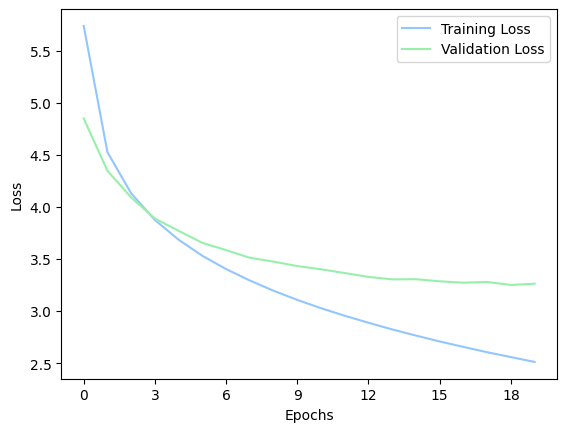

In [ ]:
# array_loss_train, array_loss_valid = [5.736021459863541, 4.524896071819549, 4.129244547701896, 3.8738511562347413, 3.6842893935264427, 3.530107229313952, 3.4029198748000127, 3.2929655815692658, 3.194780033192736, 3.107163892908299, 3.027307792420083, 2.954678220951811, 2.887794178090197, 2.8236083365501243, 2.76472807640725, 2.708047126201873, 2.656014417080169, 2.6049902398535547, 2.558347993201398, 2.5118204461767317], [4.847683906555176, 4.346325767040253, 4.090254718065262, 3.886866235733032, 3.7699634075164794, 3.654539793729782, 3.584583395719528, 3.51115403175354, 3.474466198682785, 3.431464672088623, 3.400925076007843, 3.3644541025161745, 3.3278374910354613, 3.3037003099918367, 3.305619341135025, 3.285557305812836, 3.2718856990337373, 3.278909432888031, 3.250745749473572, 3.2621746599674224]

plt.style.use("seaborn-v0_8-pastel")
plt.plot(array_loss_train, label='Training Loss')
plt.plot(array_loss_valid, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.show()


#### flickr30k

In [ ]:
tokenizer = SimpleTokenizer(flickr30k_df['caption'], max_len=30)
encoder = EncoderResnet50(encoded_dim=256)
decoder = DecoderLSTM(encoder_dim=256, embed_size=256, hidden_size=512, vocab_size=tokenizer.vocab_size)
model = CaptioningModel(encoder, decoder).to(device)
criterion = nn.CrossEntropyLoss(ignore_index=tokenizer.pad_token_id)
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=1e-4)

array_loss_train, array_loss_valid = train(flickr30k_df, datasets['flickr30k']['img_folder'], datasets['flickr30k']['folder'], model, tokenizer, optimizer, criterion, device, file_prefix="resnet_lstm_30k")


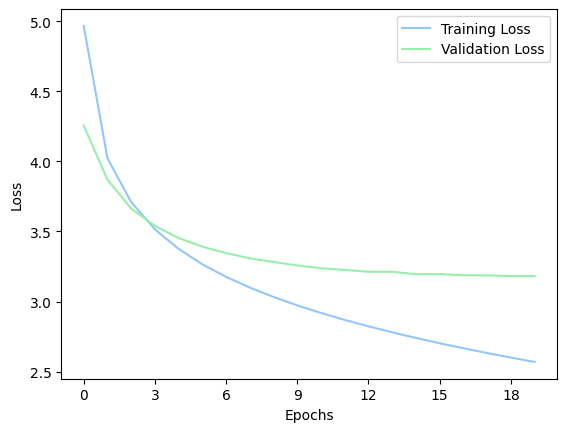

In [ ]:
array_loss_train, array_loss_valid = [4.967841457710367, 4.022558999082627, 3.710269966697861, 3.515500058774283, 3.375300892453644, 3.2656115591262993, 3.1760076361215965, 3.0993317579234057, 3.032288062288397, 2.9723546273500014, 2.9182205221238435, 2.86849152336895, 2.8227048092780658, 2.7797107928007554, 2.7399944604653124, 2.7019600504179078, 2.666350131316829, 2.632063906485279, 2.59962503150408, 2.568635530000436], [4.2573517203331, 3.8699351608753205, 3.6639890551567076, 3.539891278743744, 3.4528555870056152, 3.391467869281769, 3.346007853746414, 3.3081902742385862, 3.2822610437870026, 3.2576422870159147, 3.2375914633274077, 3.2256694614887236, 3.2124527394771576, 3.2123600840568542, 3.19470095038414, 3.1959192156791687, 3.1877482354640962, 3.1865978300571443, 3.181886428594589, 3.180860775709152]
plt.style.use("seaborn-v0_8-pastel")
plt.plot(array_loss_train, label='Training Loss')
plt.plot(array_loss_valid, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.show()


### Qualitative evaluation

In [50]:
def generate_caption(image_path, model, tokenizer, max_length=50, device=device):
    model.eval()
    if isinstance(model, nn.DataParallel):
        encoder = model.module.encoder
        decoder = model.module.decoder
    else:
        encoder = model.encoder
        decoder = model.decoder

    image = load_image(image_path)
    image = image_transform(image).unsqueeze(0).to(device)

    with torch.no_grad():
        img_features = encoder(image)

        input_ids = torch.tensor(
            [[tokenizer.cls_token_id]], dtype=torch.long).to(device)

        generated_ids = []

        for _ in range(max_length):

            outputs = decoder(img_features, input_ids)
            logits = outputs[:, -1, :]
            predicted_id = logits.argmax(dim=1).unsqueeze(1)

            if predicted_id.item() == tokenizer.sep_token_id:
                break
            generated_ids.append(predicted_id.item())
            input_ids = torch.cat([input_ids, predicted_id], dim=1)

    caption = tokenizer.decode(generated_ids, skip_special_tokens=True)
    return caption


#### flickr8k

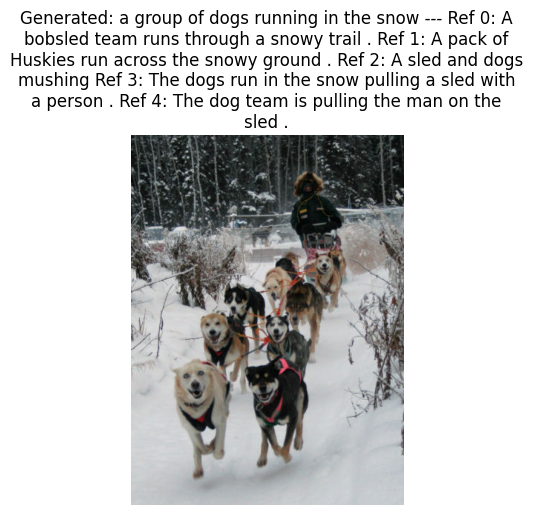

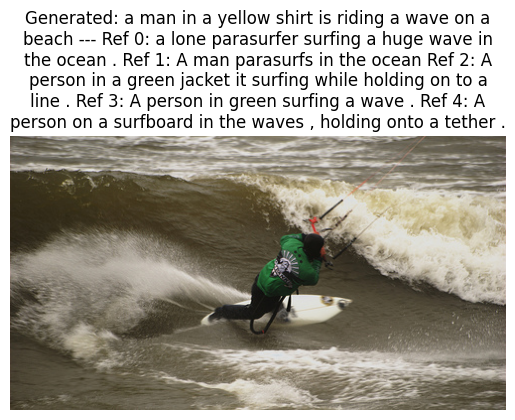

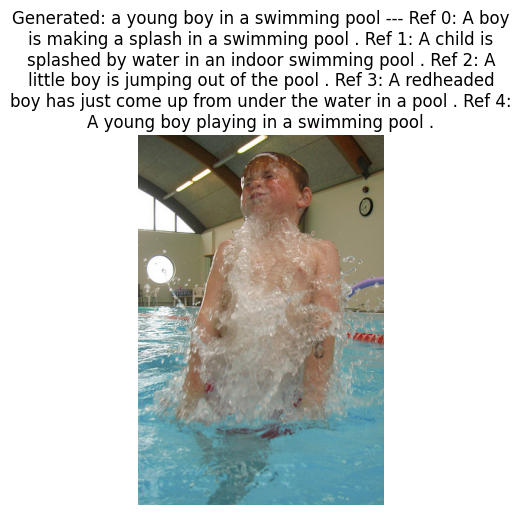

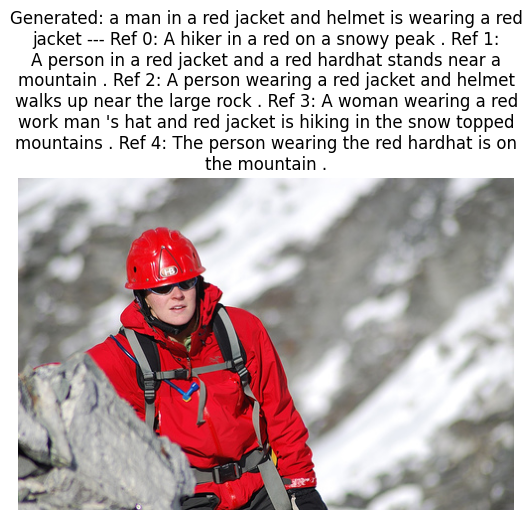

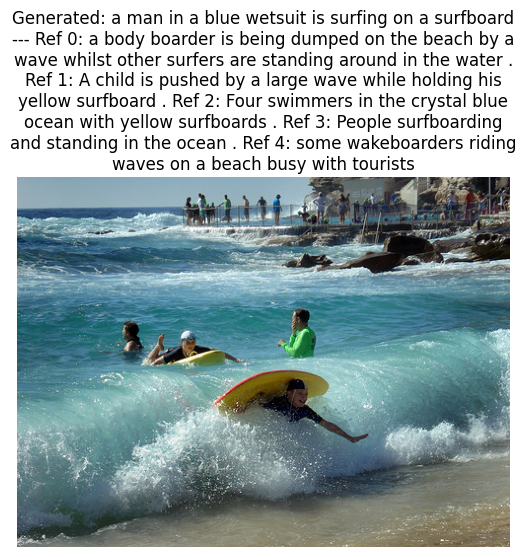

In [39]:
model_path = os.path.join(datasets['flickr8k']['folder'], 'resnet_lstm_8k_19.pth')
tokenizer = SimpleTokenizer(flickr8k_df['caption'], max_len=30)
encoder = EncoderResnet50(encoded_dim=256)
decoder = DecoderLSTM(encoder_dim=256, embed_size=256, hidden_size=512, vocab_size=tokenizer.vocab_size)
model = CaptioningModel(encoder, decoder)
load_model(model_path, model)

test_data8k = flickr8k_df[flickr8k_df['split']
                          == 'test'].reset_index(drop=True)
# unique_images = test_data8k['image'].drop_duplicates().sample(5)
unique_images = ["3113322995_13781860f2.jpg", "3044536048_e615466e7f.jpg",
                 "2660008870_b672a4c76a.jpg", "416960865_048fd3f294.jpg", "1998457059_c9ac9a1e1a.jpg"]

for image_name in unique_images:
    refs = test_data8k[test_data8k['image'] == image_name]['caption'].tolist()

    image_path = os.path.join(datasets['flickr8k']['img_folder'], image_name)
    generated_caption = generate_caption(
        image_path, model, tokenizer, max_length=30, device=device)
    image = load_image(image_path)
    refs_str = "\n".join([f"Ref {i}: {c}" for i, c in enumerate(refs)])
    show_image(image, title=f"Generated: {generated_caption}\n---\n{refs_str}")


#### flickr30k

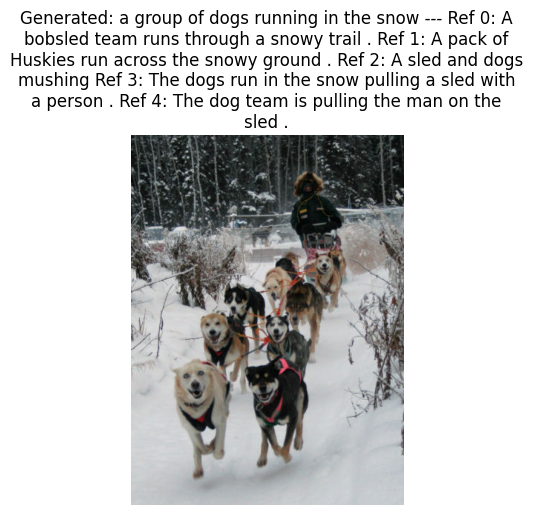

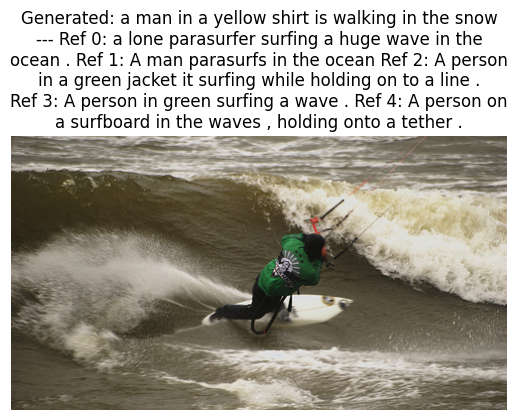

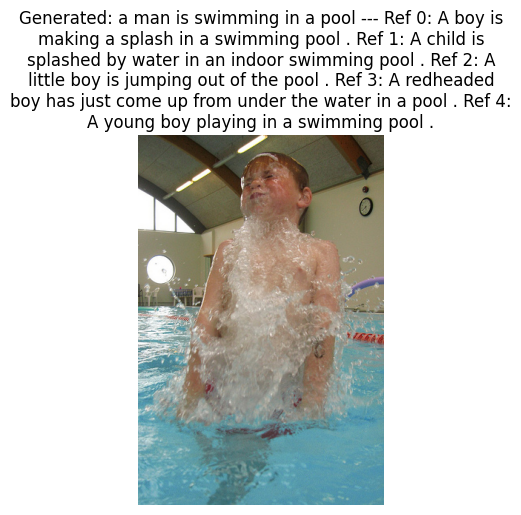

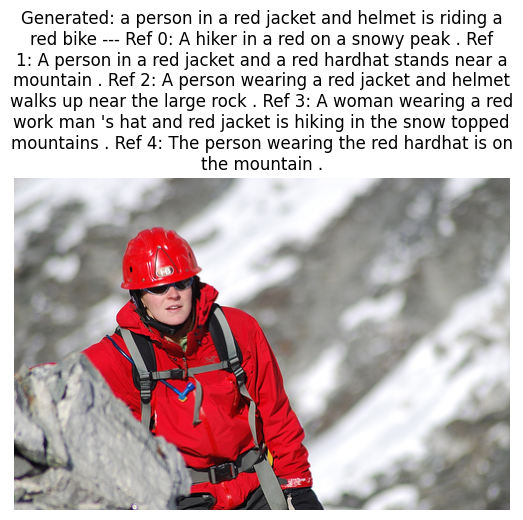

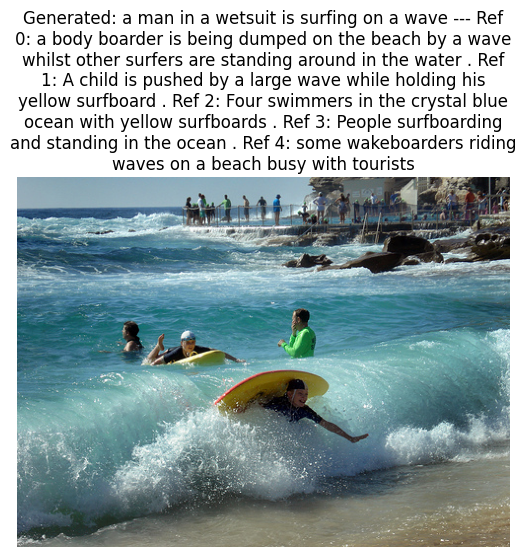

In [38]:
model_path = os.path.join(datasets['flickr30k']['folder'], 'resnet_lstm_30k_20.pth')
tokenizer = SimpleTokenizer(flickr30k_df['caption'], max_len=30)
encoder = EncoderResnet50(encoded_dim=256)
decoder = DecoderLSTM(encoder_dim=256, embed_size=256, hidden_size=512, vocab_size=tokenizer.vocab_size)
model = CaptioningModel(encoder, decoder)
load_model(model_path, model)

test_data8k = flickr8k_df[flickr8k_df['split']
                          == 'test'].reset_index(drop=True)
# unique_images = test_data8k['image'].drop_duplicates().sample(5)
unique_images = ["3113322995_13781860f2.jpg", "3044536048_e615466e7f.jpg",
                 "2660008870_b672a4c76a.jpg", "416960865_048fd3f294.jpg", "1998457059_c9ac9a1e1a.jpg"]

# On flickr8k dataset same test images voluntarily
for image_name in unique_images:
    refs = test_data8k[test_data8k['image'] == image_name]['caption'].tolist()

    image_path = os.path.join(datasets['flickr8k']['img_folder'], image_name)
    generated_caption = generate_caption(
        image_path, model, tokenizer, max_length=30, device=device)
    image = load_image(image_path)
    refs_str = "\n".join([f"Ref {i}: {c}" for i, c in enumerate(refs)])
    show_image(image, title=f"Generated: {generated_caption}\n---\n{refs_str}")


### Quantitative evaluation

#### flickr8k

In [63]:
model_path = os.path.join(datasets['flickr8k']['folder'], 'resnet_lstm_8k_19.pth')
tokenizer = SimpleTokenizer(flickr8k_df['caption'], max_len=30)
encoder = EncoderResnet50(encoded_dim=256)
decoder = DecoderLSTM(encoder_dim=256, embed_size=256, hidden_size=512, vocab_size=tokenizer.vocab_size)
model = CaptioningModel(encoder, decoder)
load_model(model_path, model)

test_data8k = flickr8k_df[flickr8k_df['split']== 'test'].reset_index(drop=True)

all_hypotheses, all_refs = [], []
for image_name in test_data8k['image'].unique():
  image_path = os.path.join(datasets['flickr8k']['img_folder'], image_name)
  hypothese = generate_caption(
      image_path, model, tokenizer, max_length=30, device=device)
  raw_ref = test_data8k[test_data8k['image'] == image_name]['caption'].tolist()
  ref = [cap.lower().split() for cap in raw_ref]
  all_hypotheses.append(hypothese.split())
  all_refs.append(ref)
store_scores("Flickr8k - Resnet50 + LSTM", all_refs, all_hypotheses)


==== Results for Flickr8k - Resnet50 + LSTM ====
BLEU-1: 0.5609 - BLEU-2: 0.3787 - BLEU-3: 0.2517 - BLEU-4: 0.1614


#### flickr30k

In [64]:
model_path = os.path.join(datasets['flickr30k']['folder'], 'resnet_lstm_30k_20.pth')
tokenizer = SimpleTokenizer(flickr30k_df['caption'], max_len=30)
encoder = EncoderResnet50(encoded_dim=256)
decoder = DecoderLSTM(encoder_dim=256, embed_size=256, hidden_size=512, vocab_size=tokenizer.vocab_size)
model = CaptioningModel(encoder, decoder)
load_model(model_path, model)

test_data30k = flickr30k_df[flickr30k_df['split']== 'test'].reset_index(drop=True)

all_hypotheses, all_refs = [], []
for image_name in test_data30k['image'].unique():
  image_path = os.path.join(datasets['flickr30k']['img_folder'], image_name)
  hypothese = generate_caption(
      image_path, model, tokenizer, max_length=30, device=device)
  raw_ref = test_data30k[test_data30k['image'] == image_name]['caption'].tolist()
  ref = [cap.lower().split() for cap in raw_ref]
  all_hypotheses.append(hypothese.split())
  all_refs.append(ref)
store_scores("Flickr30k - Resnet50 + LSTM", all_refs, all_hypotheses)


==== Results for Flickr30k - Resnet50 + LSTM ====
BLEU-1: 0.5679 - BLEU-2: 0.3795 - BLEU-3: 0.2521 - BLEU-4: 0.1646


## Enhanced Model

In [25]:
class EncoderVisionTransformer(nn.Module): 
    def __init__(self, encoded_dim=256):
        super().__init__()
        self.vit = models.vit_b_16(
            weights=models.ViT_B_16_Weights.IMAGENET1K_V1)
        # Freeze the ViT parameters
        for param in self.vit.parameters():
            param.requires_grad = False
        self.vit.heads = nn.Identity()
        # Transformation layers
        self.fc = nn.Linear(768, encoded_dim)
        self.bn = nn.BatchNorm1d(encoded_dim)
        self.relu = nn.ReLU()

    def forward(self, images):
        with torch.no_grad():
            features = self.vit(images) # shape: [Batch_Size, 768]
        features = self.relu(self.bn(self.fc(features)))
        return features


class DecoderTransformer(nn.Module):
    def __init__(self, encoder_dim, embed_size, num_heads, hidden_size, vocab_size, num_layers=1):
        super().__init__()
        self.embed_size = embed_size
        self.vocab_size = vocab_size

        self.embedding = nn.Embedding(vocab_size, embed_size)
        self.positional_encoding = nn.Parameter(torch.zeros(1, 500, embed_size))
        self.encoder_proj = nn.Linear(encoder_dim, embed_size) if encoder_dim != embed_size else nn.Identity()

        transformer_layer = nn.TransformerDecoderLayer(
            d_model=embed_size,
            nhead=num_heads, 
            dim_feedforward=hidden_size,
            batch_first=False
        )
        self.transformer_decoder = nn.TransformerDecoder(transformer_layer, num_layers=num_layers)
        self.linear = nn.Linear(embed_size, vocab_size)

    def generate_square_subsequent_mask(self, sz):
        mask = (torch.triu(torch.ones(sz, sz)) == 1).transpose(0, 1)
        mask = mask.float().masked_fill(mask == 0, float('-inf')).masked_fill(mask == 1, float(0.0))
        return mask

    def forward(self, features, captions):
        embeddings = self.embedding(captions)
        embeddings = embeddings + self.positional_encoding[:, :embeddings.size(1), :]
        tgt = embeddings.permute(1, 0, 2)   # [Seq, Batch, Dim]

        img_features = self.encoder_proj(features)
        memory = img_features.unsqueeze(0)  # [1, Batch, Dim]

        tgt_mask = self.generate_square_subsequent_mask(tgt.size(0)).to(tgt.device)
        hiddens = self.transformer_decoder(tgt, memory, tgt_mask=tgt_mask)
        hiddens = hiddens.permute(1, 0, 2)  # [Batch, Seq, Dim]
        outputs = self.linear(hiddens)
        return outputs

image_transform = models.ViT_B_16_Weights.IMAGENET1K_V1.transforms()


### Trainining

#### ViT + LSTM (flickr8k)

In [ ]:
tokenizer = SimpleTokenizer(flickr8k_df['caption'], max_len=30)
encoder = EncoderVisionTransformer(encoded_dim=256).to(device)
decoder = DecoderLSTM(encoder_dim=256, embed_size=256, hidden_size=512, vocab_size=tokenizer.vocab_size).to(device)
model = CaptioningModel(encoder, decoder).to(device)

criterion = nn.CrossEntropyLoss(ignore_index=tokenizer.pad_token_id)
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=1e-4)

train(flickr8k_df, datasets['flickr8k']['img_folder'], datasets['flickr8k']['folder'], model, tokenizer, optimizer, criterion, device, file_prefix="vit_lstm_8k")

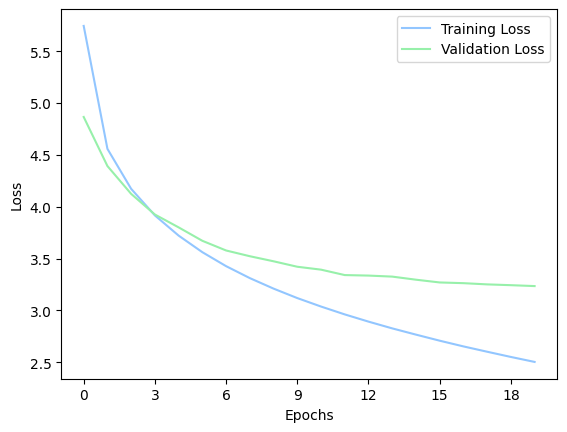

In [3]:
array_loss_train, array_loss_valid = [5.743912828729508, 4.558355394322821, 4.172447306044559, 3.9162791282572647, 3.7214670678402517, 3.561489921935061, 3.4267924075431013, 3.311471938072367, 3.210227387002174, 3.118917187224043, 3.037289501758332, 2.961471784875748, 2.891876987700767, 2.82662161969124, 2.7664537237045614, 2.7079180240631104, 2.652812597599435, 2.601464493731235, 2.551050315004714, 2.5031396713662657], [4.865804183483124, 4.392442238330841, 4.123810714483261, 3.924839174747467, 3.800833910703659, 3.6713455736637117, 3.5780130684375764, 3.5226089298725127, 3.4737778186798094, 3.421105110645294, 3.3931212961673736, 3.340790832042694, 3.3359286069869993, 3.3259926199913026, 3.296262335777283, 3.269618970155716, 3.2627692461013793, 3.2510151982307436, 3.2433489143848417, 3.2346276879310607]
plt.style.use("seaborn-v0_8-pastel")
plt.plot(array_loss_train, label='Training Loss')
plt.plot(array_loss_valid, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.show()

#### ViT + Transformer (flickr8k)

In [ ]:
tokenizer = SimpleTokenizer(flickr8k_df['caption'], max_len=30)
encoder = EncoderVisionTransformer(encoded_dim=256)
decoder = DecoderTransformer(encoder_dim=256, embed_size=256, num_heads=8, hidden_size=512, vocab_size=tokenizer.vocab_size, num_layers=2)
model = CaptioningModel(encoder, decoder).to(device)

criterion = nn.CrossEntropyLoss(ignore_index=tokenizer.pad_token_id)
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=1e-4)

train(flickr8k_df, datasets['flickr8k']['img_folder'], datasets['flickr8k']['folder'], model, tokenizer, optimizer, criterion, device, file_prefix="vit_transformer_8k")


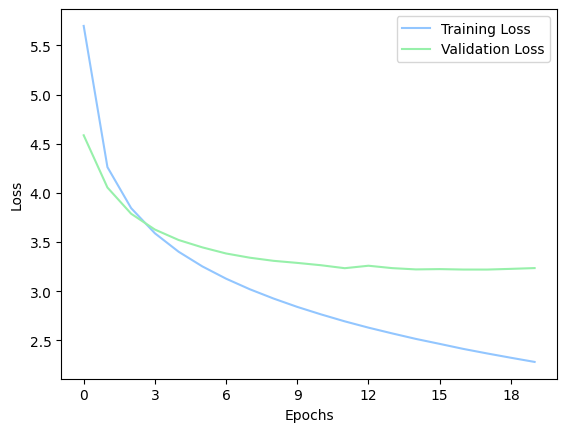

In [4]:
array_loss_train, array_loss_valid = [5.697736155733149, 4.261890196292958, 3.844412369423724, 3.5889001795586117, 3.4011473229590883, 3.2520234483353634, 3.127106983103651, 3.0196580399858193, 2.9252668888010875, 2.8401564648810855, 2.7641215040328655, 2.693318950369003, 2.6292232381536604, 2.5706936684060606, 2.514540544469306, 2.4642500420834157, 2.412889297972334, 2.366922853348103, 2.323070359737315, 2.280704572352957], [4.585579514503479, 4.054464668035507, 3.7875620901584623, 3.6267927825450896, 3.5205965101718903, 3.4455863893032075, 3.3834438562393188, 3.340552234649658, 3.3087920188903808, 3.2877317309379577, 3.2639755964279176, 3.233883076906204, 3.2588995695114136, 3.2345748960971834, 3.2215410470962524, 3.224615442752838, 3.2201394557952883, 3.2199456989765167, 3.227090686559677, 3.2350304067134856]
plt.style.use("seaborn-v0_8-pastel")
plt.plot(array_loss_train, label='Training Loss')
plt.plot(array_loss_valid, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.show()

#### ViT + Transformer + BPE (flickr8k)

In [44]:
tokenizer_bpe = GPT2Tokenizer.from_pretrained("gpt2")
tokenizer_bpe.pad_token = tokenizer_bpe.eos_token
tokenizer_bpe.bos_token = tokenizer_bpe.eos_token
tokenizer_bpe.build_inputs_with_special_tokens = lambda x, _: [tokenizer_bpe.bos_token_id] + x + [tokenizer_bpe.eos_token_id]

encoder = EncoderVisionTransformer(encoded_dim=256)
decoder = DecoderTransformer(encoder_dim=256, embed_size=256, num_heads=8, hidden_size=512, vocab_size=tokenizer_bpe.vocab_size, num_layers=2)
model = CaptioningModel(encoder, decoder).to(device)

criterion = nn.CrossEntropyLoss(ignore_index=tokenizer_bpe.pad_token_id)
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=1e-4)

train(flickr8k_df, datasets['flickr8k']['img_folder'], datasets['flickr8k']['folder'], model, tokenizer_bpe, optimizer, criterion, device, file_prefix="vit_transformer_bpe_8k")


Training on 20 epochs, batch size = 128, num_workers = 4, save_folder = data/flickr8k, file_prefix = vit_transformer_bpe_8k


Epoch 1/20 - Training: 100%|██████████| 235/235 [01:41<00:00,  2.31it/s]


Epoch 1/20 - Training Loss: 6.7021


Epoch 1/20 - Validation: 100%|██████████| 40/40 [00:16<00:00,  2.49it/s]


Epoch 1/20 - Validation Loss: 5.0505
Model saved to data/flickr8k/vit_transformer_bpe_8k_1.pth


Epoch 2/20 - Training: 100%|██████████| 235/235 [01:42<00:00,  2.30it/s]


Epoch 2/20 - Training Loss: 4.6905


Epoch 2/20 - Validation: 100%|██████████| 40/40 [00:15<00:00,  2.51it/s]


Epoch 2/20 - Validation Loss: 4.4372
Model saved to data/flickr8k/vit_transformer_bpe_8k_2.pth


Epoch 3/20 - Training: 100%|██████████| 235/235 [01:42<00:00,  2.29it/s]


Epoch 3/20 - Training Loss: 4.1906


Epoch 3/20 - Validation: 100%|██████████| 40/40 [00:15<00:00,  2.52it/s]


Epoch 3/20 - Validation Loss: 4.0829
Model saved to data/flickr8k/vit_transformer_bpe_8k_3.pth


Epoch 4/20 - Training: 100%|██████████| 235/235 [01:42<00:00,  2.30it/s]


Epoch 4/20 - Training Loss: 3.8748


Epoch 4/20 - Validation: 100%|██████████| 40/40 [00:16<00:00,  2.50it/s]


Epoch 4/20 - Validation Loss: 3.8943
Model saved to data/flickr8k/vit_transformer_bpe_8k_4.pth


Epoch 5/20 - Training: 100%|██████████| 235/235 [01:42<00:00,  2.29it/s]


Epoch 5/20 - Training Loss: 3.6470


Epoch 5/20 - Validation: 100%|██████████| 40/40 [00:15<00:00,  2.51it/s]


Epoch 5/20 - Validation Loss: 3.7359
Model saved to data/flickr8k/vit_transformer_bpe_8k_5.pth


Epoch 6/20 - Training: 100%|██████████| 235/235 [01:42<00:00,  2.29it/s]


Epoch 6/20 - Training Loss: 3.4682


Epoch 6/20 - Validation: 100%|██████████| 40/40 [00:15<00:00,  2.52it/s]


Epoch 6/20 - Validation Loss: 3.6182
Model saved to data/flickr8k/vit_transformer_bpe_8k_6.pth


Epoch 7/20 - Training: 100%|██████████| 235/235 [01:42<00:00,  2.29it/s]


Epoch 7/20 - Training Loss: 3.3224


Epoch 7/20 - Validation: 100%|██████████| 40/40 [00:15<00:00,  2.52it/s]


Epoch 7/20 - Validation Loss: 3.5353
Model saved to data/flickr8k/vit_transformer_bpe_8k_7.pth


Epoch 8/20 - Training: 100%|██████████| 235/235 [01:42<00:00,  2.29it/s]


Epoch 8/20 - Training Loss: 3.1979


Epoch 8/20 - Validation: 100%|██████████| 40/40 [00:15<00:00,  2.53it/s]


Epoch 8/20 - Validation Loss: 3.4782
Model saved to data/flickr8k/vit_transformer_bpe_8k_8.pth


Epoch 9/20 - Training: 100%|██████████| 235/235 [01:42<00:00,  2.29it/s]


Epoch 9/20 - Training Loss: 3.0850


Epoch 9/20 - Validation: 100%|██████████| 40/40 [00:15<00:00,  2.53it/s]


Epoch 9/20 - Validation Loss: 3.4320
Model saved to data/flickr8k/vit_transformer_bpe_8k_9.pth


Epoch 10/20 - Training: 100%|██████████| 235/235 [01:42<00:00,  2.30it/s]


Epoch 10/20 - Training Loss: 2.9885


Epoch 10/20 - Validation: 100%|██████████| 40/40 [00:15<00:00,  2.52it/s]


Epoch 10/20 - Validation Loss: 3.3981
Model saved to data/flickr8k/vit_transformer_bpe_8k_10.pth


Epoch 11/20 - Training: 100%|██████████| 235/235 [01:42<00:00,  2.29it/s]


Epoch 11/20 - Training Loss: 2.9015


Epoch 11/20 - Validation: 100%|██████████| 40/40 [00:15<00:00,  2.53it/s]


Epoch 11/20 - Validation Loss: 3.3673
Model saved to data/flickr8k/vit_transformer_bpe_8k_11.pth


Epoch 12/20 - Training: 100%|██████████| 235/235 [01:42<00:00,  2.29it/s]


Epoch 12/20 - Training Loss: 2.8199


Epoch 12/20 - Validation: 100%|██████████| 40/40 [00:15<00:00,  2.53it/s]


Epoch 12/20 - Validation Loss: 3.3463
Model saved to data/flickr8k/vit_transformer_bpe_8k_12.pth


Epoch 13/20 - Training: 100%|██████████| 235/235 [01:42<00:00,  2.29it/s]


Epoch 13/20 - Training Loss: 2.7488


Epoch 13/20 - Validation: 100%|██████████| 40/40 [00:15<00:00,  2.53it/s]


Epoch 13/20 - Validation Loss: 3.3081
Model saved to data/flickr8k/vit_transformer_bpe_8k_13.pth


Epoch 14/20 - Training: 100%|██████████| 235/235 [01:42<00:00,  2.30it/s]


Epoch 14/20 - Training Loss: 2.6803


Epoch 14/20 - Validation: 100%|██████████| 40/40 [00:15<00:00,  2.53it/s]


Epoch 14/20 - Validation Loss: 3.2987
Model saved to data/flickr8k/vit_transformer_bpe_8k_14.pth


Epoch 15/20 - Training: 100%|██████████| 235/235 [01:42<00:00,  2.30it/s]


Epoch 15/20 - Training Loss: 2.6183


Epoch 15/20 - Validation: 100%|██████████| 40/40 [00:15<00:00,  2.53it/s]


Epoch 15/20 - Validation Loss: 3.2943
Model saved to data/flickr8k/vit_transformer_bpe_8k_15.pth


Epoch 16/20 - Training: 100%|██████████| 235/235 [01:42<00:00,  2.30it/s]


Epoch 16/20 - Training Loss: 2.5593


Epoch 16/20 - Validation: 100%|██████████| 40/40 [00:15<00:00,  2.53it/s]


Epoch 16/20 - Validation Loss: 3.3134


Epoch 17/20 - Training: 100%|██████████| 235/235 [01:42<00:00,  2.29it/s]


Epoch 17/20 - Training Loss: 2.5051


Epoch 17/20 - Validation: 100%|██████████| 40/40 [00:15<00:00,  2.52it/s]


Epoch 17/20 - Validation Loss: 3.2738
Model saved to data/flickr8k/vit_transformer_bpe_8k_17.pth


Epoch 18/20 - Training: 100%|██████████| 235/235 [01:42<00:00,  2.30it/s]


Epoch 18/20 - Training Loss: 2.4551


Epoch 18/20 - Validation: 100%|██████████| 40/40 [00:15<00:00,  2.53it/s]


Epoch 18/20 - Validation Loss: 3.2889


Epoch 19/20 - Training: 100%|██████████| 235/235 [01:42<00:00,  2.29it/s]


Epoch 19/20 - Training Loss: 2.4067


Epoch 19/20 - Validation: 100%|██████████| 40/40 [00:15<00:00,  2.52it/s]


Epoch 19/20 - Validation Loss: 3.2713
Model saved to data/flickr8k/vit_transformer_bpe_8k_19.pth


Epoch 20/20 - Training: 100%|██████████| 235/235 [01:42<00:00,  2.29it/s]


Epoch 20/20 - Training Loss: 2.3594


Epoch 20/20 - Validation: 100%|██████████| 40/40 [00:15<00:00,  2.53it/s]


Epoch 20/20 - Validation Loss: 3.2709
Model saved to data/flickr8k/vit_transformer_bpe_8k_20.pth


([6.702116586806926,
  4.690516482008264,
  4.190647272353477,
  3.8747849352816317,
  3.6470183068133415,
  3.468184261119112,
  3.322392911099373,
  3.197864756685622,
  3.0849987953267197,
  2.9884870752375177,
  2.901451602895209,
  2.819904048392113,
  2.7488338460313515,
  2.680268438826216,
  2.6183289436583825,
  2.5592999214821672,
  2.5050968647003176,
  2.4551174173963832,
  2.4066889184586544,
  2.359417710405715],
 [5.050547850131989,
  4.437245655059814,
  4.082928240299225,
  3.8943051040172576,
  3.7359039902687075,
  3.618206924200058,
  3.535322344303131,
  3.47816122174263,
  3.4319890558719637,
  3.3980643689632415,
  3.367271375656128,
  3.3462917029857637,
  3.3081037163734437,
  3.2987315714359284,
  3.2942510664463045,
  3.3133898854255674,
  3.273827147483826,
  3.288868921995163,
  3.2713130950927733,
  3.2708629250526426])

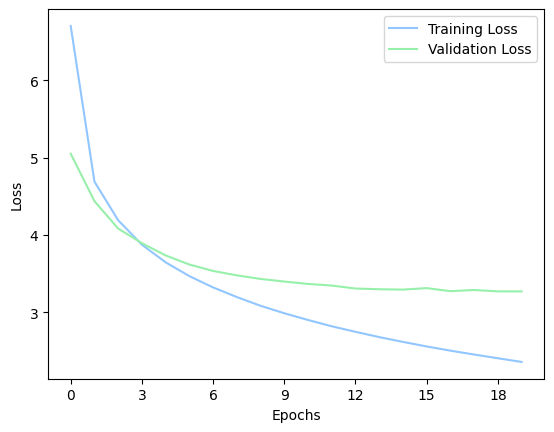

In [45]:
array_loss_train, array_loss_valid = [6.702116586806926, 4.690516482008264, 4.190647272353477, 3.8747849352816317, 3.6470183068133415, 3.468184261119112, 3.322392911099373, 3.197864756685622, 3.0849987953267197, 2.9884870752375177, 2.901451602895209, 2.819904048392113, 2.7488338460313515, 2.680268438826216, 2.6183289436583825, 2.5592999214821672, 2.5050968647003176, 2.4551174173963832, 2.4066889184586544, 2.359417710405715], [5.050547850131989, 4.437245655059814, 4.082928240299225, 3.8943051040172576, 3.7359039902687075, 3.618206924200058, 3.535322344303131, 3.47816122174263, 3.4319890558719637, 3.3980643689632415, 3.367271375656128, 3.3462917029857637, 3.3081037163734437, 3.2987315714359284, 3.2942510664463045, 3.3133898854255674, 3.273827147483826, 3.288868921995163, 3.2713130950927733, 3.2708629250526426]
plt.style.use("seaborn-v0_8-pastel")
plt.plot(array_loss_train, label='Training Loss')
plt.plot(array_loss_valid, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.show()


#### ViT + Transformer + BPE (flickr30k)

In [ ]:
tokenizer_bpe = GPT2Tokenizer.from_pretrained("gpt2")
tokenizer_bpe.pad_token = tokenizer_bpe.eos_token
tokenizer_bpe.build_inputs_with_special_tokens = lambda x, _: [tokenizer_bpe.bos_token_id] + x + [tokenizer_bpe.eos_token_id]

encoder = EncoderVisionTransformer(encoded_dim=256)
decoder = DecoderTransformer(encoder_dim=256, embed_size=256, num_heads=8, hidden_size=512, vocab_size=tokenizer_bpe.vocab_size, num_layers=2)
model = CaptioningModel(encoder, decoder).to(device)

criterion = nn.CrossEntropyLoss(ignore_index=tokenizer_bpe.pad_token_id)
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=1e-4)

train(flickr30k_df, datasets['flickr30k']['img_folder'], datasets['flickr30k']['folder'], model, tokenizer_bpe, optimizer, criterion, device, file_prefix="vit_transformer_bpe_30k")


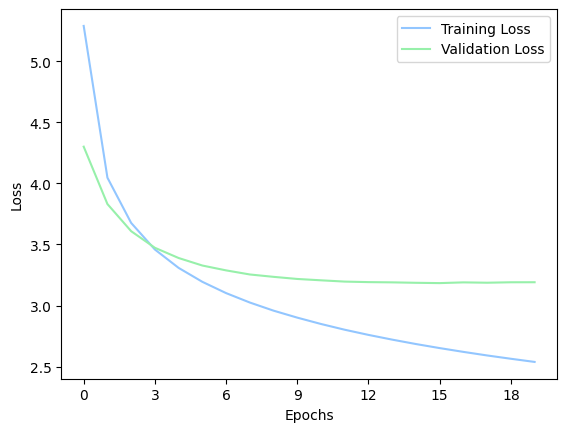

In [60]:
array_loss_train, array_loss_valid = [5.28975242318459, 4.047080523548985, 3.6764018152629183, 3.458775715815316, 3.308228983883298, 3.1941532682551816, 3.101786463006029, 3.0246533421636785, 2.958024857218878, 2.900884091906703, 2.8488359219819595, 2.801808953811295, 2.7595032606099625, 2.7207805592721264, 2.68467647736828, 2.6514835441838507, 2.620450917746467, 2.591199594793968, 2.5641038529344713, 2.538249286422662], [4.300873672962188, 3.8310761570930483, 3.608791935443878, 3.472935712337494, 3.3891678273677828, 3.327600818872452, 3.287880724668503, 3.2543636560440063, 3.234937697649002, 3.2176182568073273, 3.206532824039459, 3.1960418045520784, 3.1917700231075288, 3.1897823452949523, 3.186206489801407, 3.183652675151825, 3.1896483957767487, 3.1868322253227235, 3.190494656562805, 3.1908246338367463]
plt.style.use("seaborn-v0_8-pastel")
plt.plot(array_loss_train, label='Training Loss')
plt.plot(array_loss_valid, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.show()

### Qualitative evaluation

#### ViT + LSTM

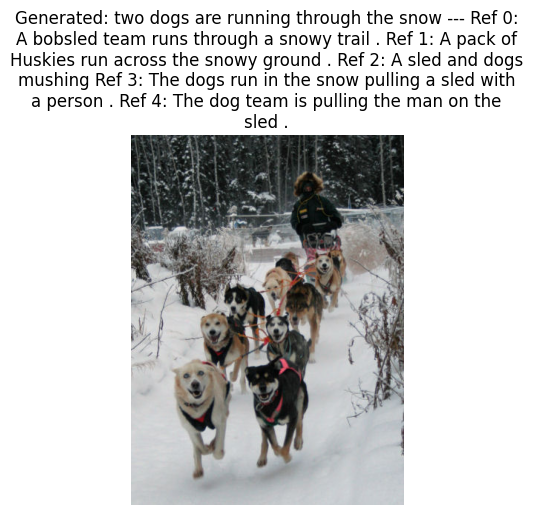

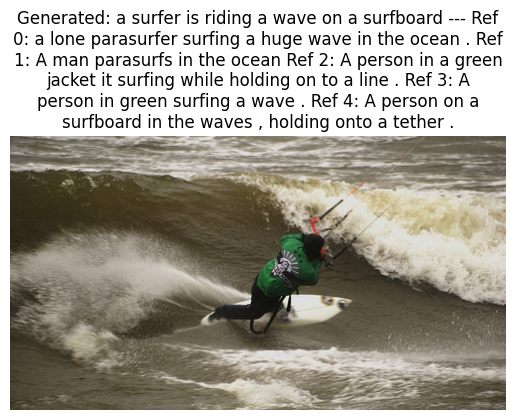

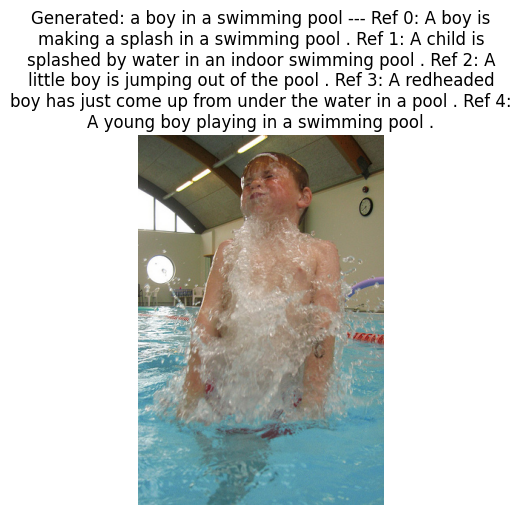

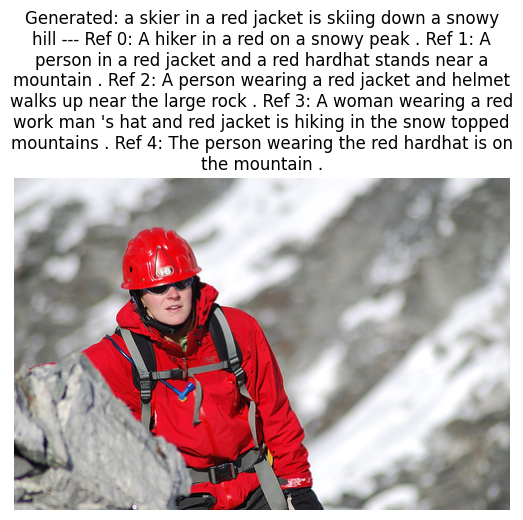

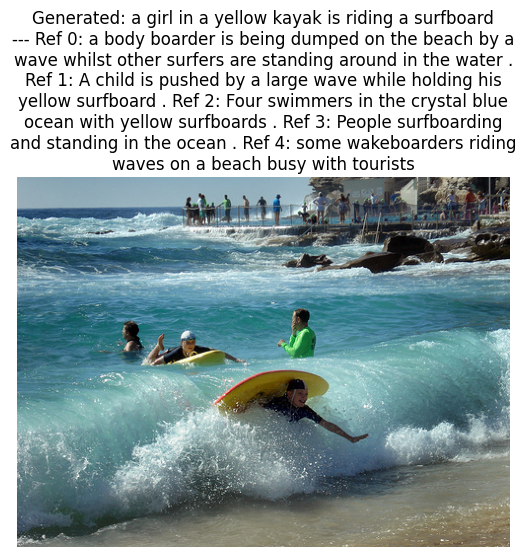

In [40]:
model_path = os.path.join(datasets['flickr8k']['folder'], 'vit_lstm_8k_20.pth')
tokenizer = SimpleTokenizer(flickr8k_df['caption'], max_len=30)
encoder = EncoderVisionTransformer(encoded_dim=256).to(device)
decoder = DecoderLSTM(encoder_dim=256, embed_size=256, hidden_size=512, vocab_size=tokenizer.vocab_size).to(device)
model = CaptioningModel(encoder, decoder)
load_model(model_path, model)

test_data8k = flickr8k_df[flickr8k_df['split']
                          == 'test'].reset_index(drop=True)
# unique_images = test_data8k['image'].drop_duplicates().sample(5)
unique_images = ["3113322995_13781860f2.jpg", "3044536048_e615466e7f.jpg",
                 "2660008870_b672a4c76a.jpg", "416960865_048fd3f294.jpg", "1998457059_c9ac9a1e1a.jpg"]

for image_name in unique_images:
    refs = test_data8k[test_data8k['image'] == image_name]['caption'].tolist()

    image_path = os.path.join(datasets['flickr8k']['img_folder'], image_name)
    generated_caption = generate_caption(
        image_path, model, tokenizer, max_length=30, device=device)
    image = load_image(image_path)
    refs_str = "\n".join([f"Ref {i}: {c}" for i, c in enumerate(refs)])
    show_image(image, title=f"Generated: {generated_caption}\n---\n{refs_str}")


#### ViT + Transformer

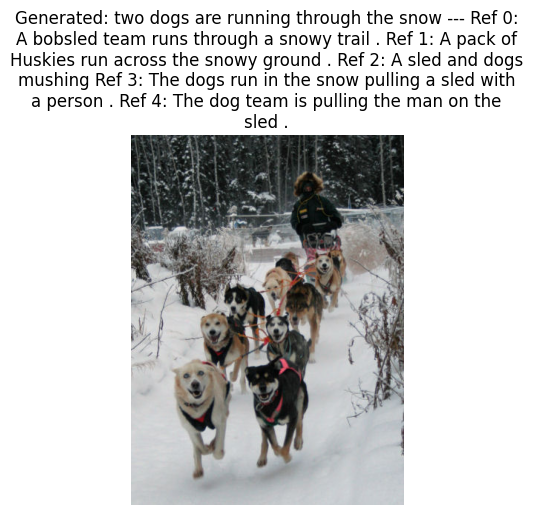

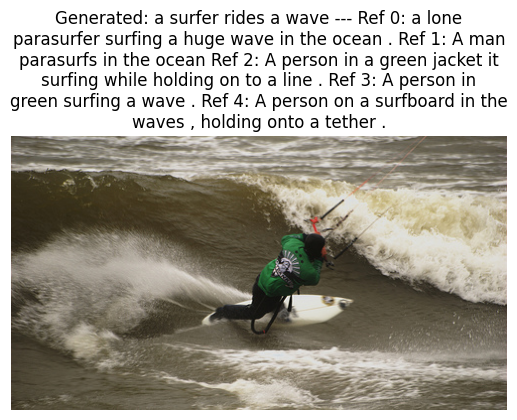

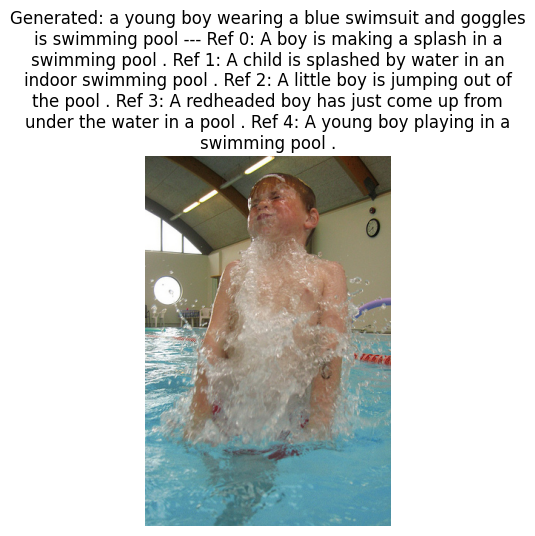

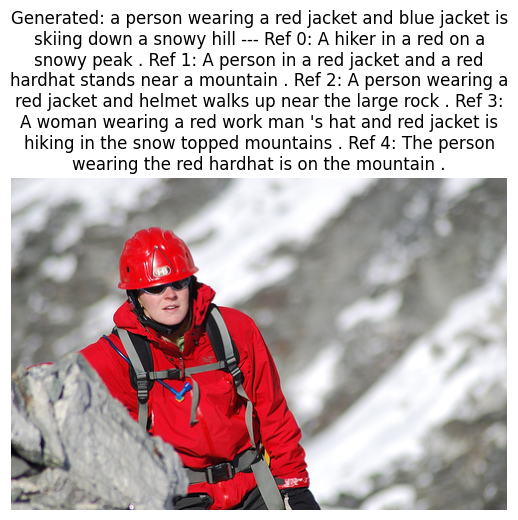

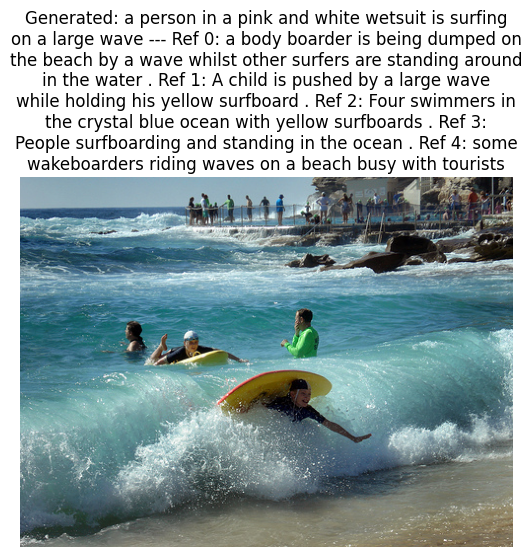

In [41]:
model_path = os.path.join(datasets['flickr8k']['folder'], 'vit_transformer_8k_18.pth')
tokenizer = SimpleTokenizer(flickr8k_df['caption'], max_len=30)
encoder = EncoderVisionTransformer(encoded_dim=256)
decoder = DecoderTransformer(encoder_dim=256, embed_size=256, num_heads=8, hidden_size=512, vocab_size=tokenizer.vocab_size, num_layers=2)
model = CaptioningModel(encoder, decoder)
load_model(model_path, model)

test_data8k = flickr8k_df[flickr8k_df['split']
                          == 'test'].reset_index(drop=True)
# unique_images = test_data8k['image'].drop_duplicates().sample(5)
unique_images = ["3113322995_13781860f2.jpg", "3044536048_e615466e7f.jpg",
                 "2660008870_b672a4c76a.jpg", "416960865_048fd3f294.jpg", "1998457059_c9ac9a1e1a.jpg"]

for image_name in unique_images:
    refs = test_data8k[test_data8k['image'] == image_name]['caption'].tolist()

    image_path = os.path.join(datasets['flickr8k']['img_folder'], image_name)
    generated_caption = generate_caption(
        image_path, model, tokenizer, max_length=30, device=device)
    image = load_image(image_path)
    refs_str = "\n".join([f"Ref {i}: {c}" for i, c in enumerate(refs)])
    show_image(image, title=f"Generated: {generated_caption}\n---\n{refs_str}")


#### ViT + Transformer + BPE (flickr8k)

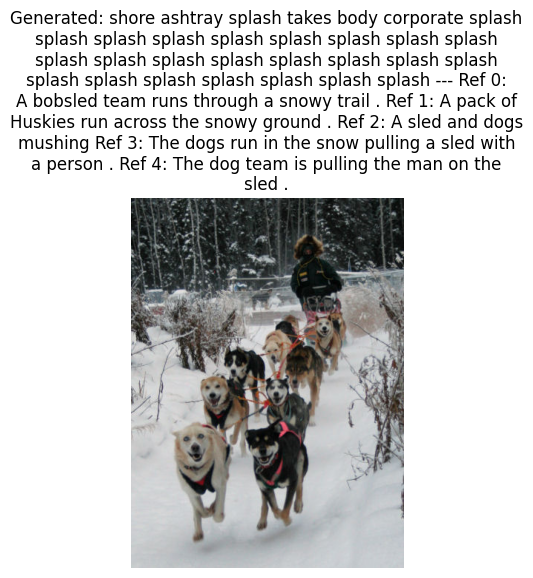

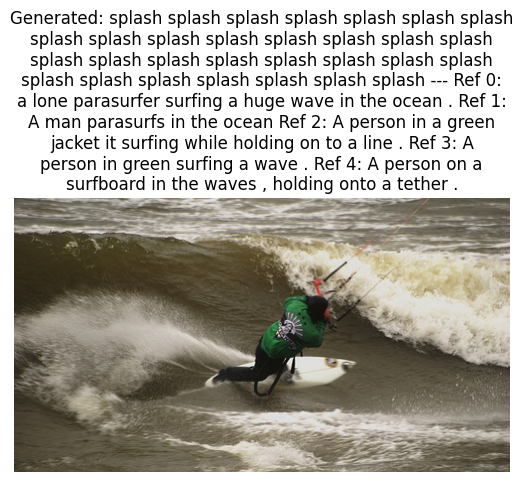

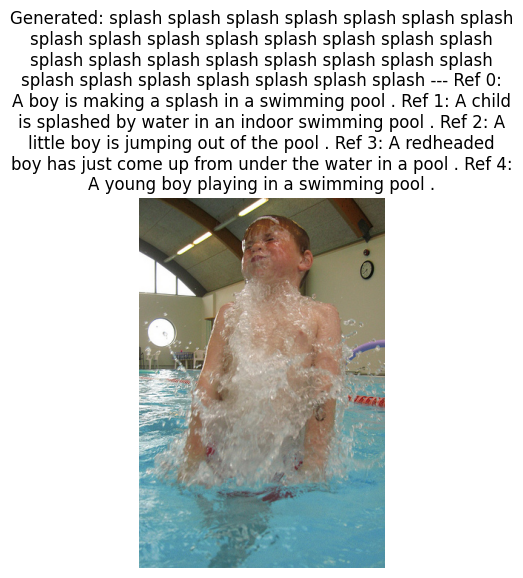

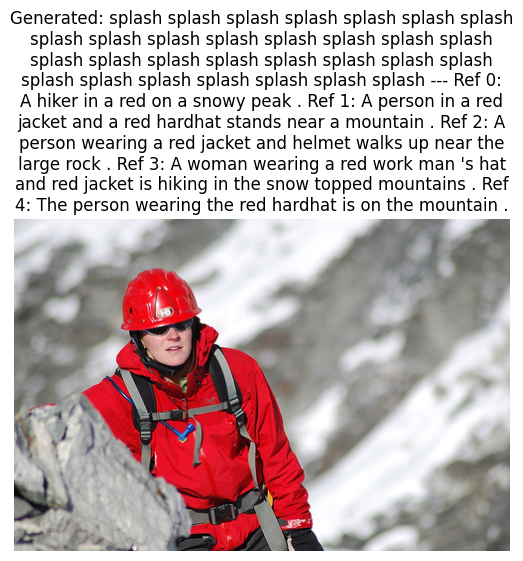

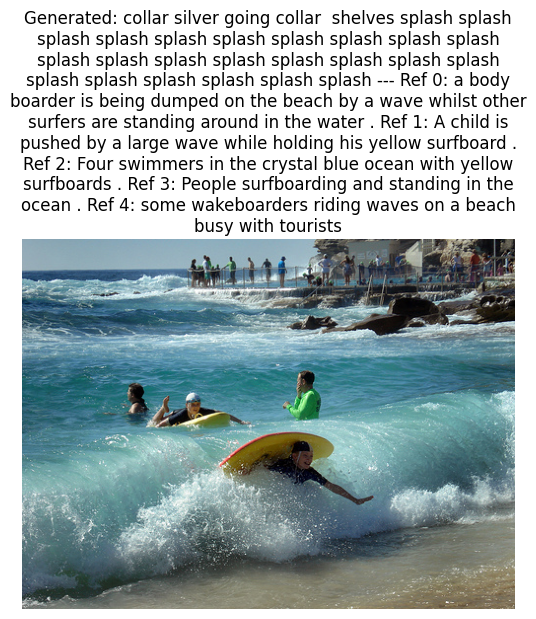

In [ ]:
model_path = os.path.join(datasets['flickr8k']['folder'], 'vit_transformer_bpe_8k_20.pth')
tokenizer_bpe = GPT2Tokenizer.from_pretrained("gpt2")
tokenizer_bpe.pad_token = tokenizer_bpe.eos_token
tokenizer_bpe.cls_token_id = tokenizer_bpe.bos_token_id
tokenizer_bpe.sep_token_id = tokenizer_bpe.eos_token_id
tokenizer_bpe.build_inputs_with_special_tokens = lambda x, _: [tokenizer_bpe.bos_token_id] + x + [tokenizer_bpe.eos_token_id]
encoder = EncoderVisionTransformer(encoded_dim=256)
decoder = DecoderTransformer(encoder_dim=256, embed_size=256, num_heads=8, hidden_size=512, vocab_size=tokenizer_bpe.vocab_size, num_layers=2)
model = CaptioningModel(encoder, decoder)
load_model(model_path, model)

test_data8k = flickr8k_df[flickr8k_df['split']
                          == 'test'].reset_index(drop=True)
# unique_images = test_data8k['image'].drop_duplicates().sample(5)
unique_images = ["3113322995_13781860f2.jpg", "3044536048_e615466e7f.jpg",
                 "2660008870_b672a4c76a.jpg", "416960865_048fd3f294.jpg", "1998457059_c9ac9a1e1a.jpg"]

for image_name in unique_images:
    refs = test_data8k[test_data8k['image'] == image_name]['caption'].tolist()

    image_path = os.path.join(datasets['flickr8k']['img_folder'], image_name)
    generated_caption = generate_caption(
        image_path, model, tokenizer, max_length=30, device=device)
    image = load_image(image_path)
    refs_str = "\n".join([f"Ref {i}: {c}" for i, c in enumerate(refs)])
    show_image(image, title=f"Generated: {generated_caption}\n---\n{refs_str}")


#### ViT + Transformer + BPE (flickr30k)

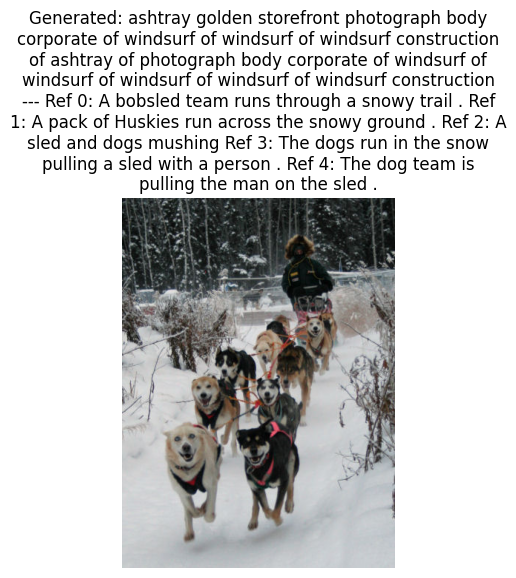

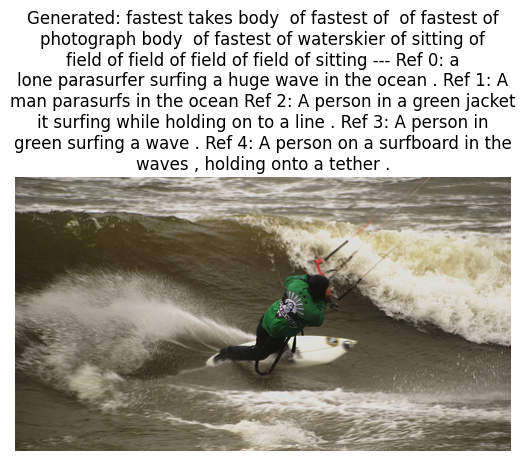

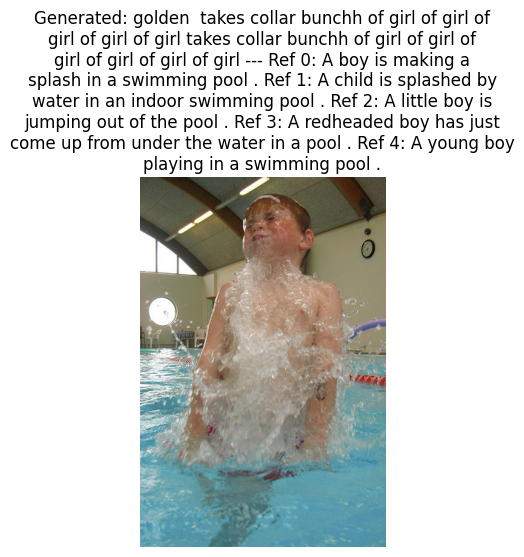

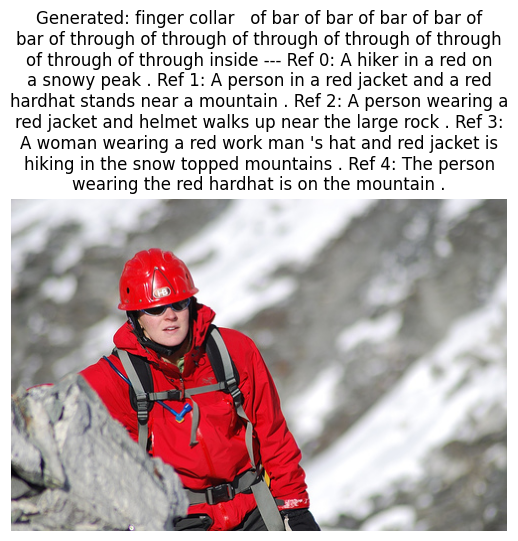

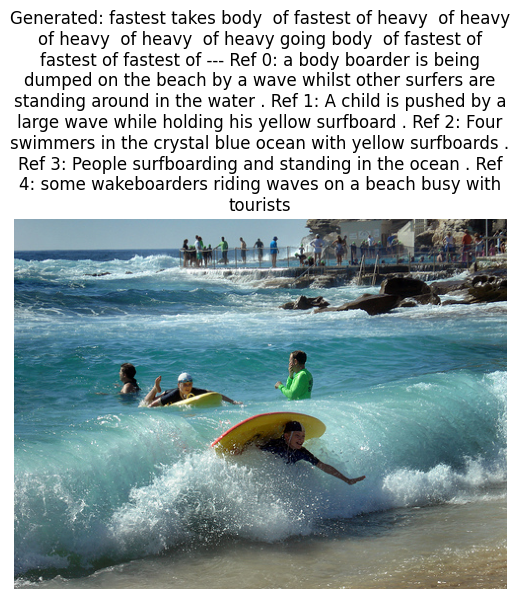

In [58]:
model_path = os.path.join(datasets['flickr30k']['folder'], 'vit_transformer_bpe_30k_16.pth')
tokenizer_bpe = GPT2Tokenizer.from_pretrained("gpt2")
tokenizer_bpe.pad_token = tokenizer_bpe.eos_token
tokenizer_bpe.cls_token_id = tokenizer_bpe.bos_token_id
tokenizer_bpe.sep_token_id = tokenizer_bpe.eos_token_id
tokenizer_bpe.build_inputs_with_special_tokens = lambda x, _: [tokenizer_bpe.bos_token_id] + x + [tokenizer_bpe.eos_token_id]
encoder = EncoderVisionTransformer(encoded_dim=256)
decoder = DecoderTransformer(encoder_dim=256, embed_size=256, num_heads=8, hidden_size=512, vocab_size=tokenizer_bpe.vocab_size, num_layers=2)
model = CaptioningModel(encoder, decoder)
load_model(model_path, model)

test_data30k = flickr30k_df[flickr30k_df['split']
                          == 'test'].reset_index(drop=True)
# unique_images = test_data8k['image'].drop_duplicates().sample(5)
unique_images = ["3113322995_13781860f2.jpg", "3044536048_e615466e7f.jpg",
                 "2660008870_b672a4c76a.jpg", "416960865_048fd3f294.jpg", "1998457059_c9ac9a1e1a.jpg"]

for image_name in unique_images:
    refs = test_data8k[test_data8k['image'] == image_name]['caption'].tolist()

    image_path = os.path.join(datasets['flickr8k']['img_folder'], image_name)
    generated_caption = generate_caption(
        image_path, model, tokenizer, max_length=30, device=device)
    image = load_image(image_path)
    refs_str = "\n".join([f"Ref {i}: {c}" for i, c in enumerate(refs)])
    show_image(image, title=f"Generated: {generated_caption}\n---\n{refs_str}")


### Quantitative evaluation

#### ViT + LSTM

In [65]:
model_path = os.path.join(datasets['flickr8k']['folder'], 'vit_lstm_8k_20.pth')
tokenizer = SimpleTokenizer(flickr8k_df['caption'], max_len=30)
encoder = EncoderVisionTransformer(encoded_dim=256).to(device)
decoder = DecoderLSTM(encoder_dim=256, embed_size=256, hidden_size=512, vocab_size=tokenizer.vocab_size).to(device)
model = CaptioningModel(encoder, decoder)
load_model(model_path, model)

test_data8k = flickr8k_df[flickr8k_df['split']== 'test'].reset_index(drop=True)

all_hypotheses, all_refs = [], []
for image_name in test_data8k['image'].unique():
  image_path = os.path.join(datasets['flickr8k']['img_folder'], image_name)
  hypothese = generate_caption(
      image_path, model, tokenizer, max_length=30, device=device)
  raw_ref = test_data8k[test_data8k['image'] == image_name]['caption'].tolist()
  ref = [cap.lower().split() for cap in raw_ref]
  all_hypotheses.append(hypothese.split())
  all_refs.append(ref)
store_scores("Flickr8k - ViT + LSTM", all_refs, all_hypotheses)


==== Results for Flickr8k - ViT + LSTM ====
BLEU-1: 0.5764 - BLEU-2: 0.3982 - BLEU-3: 0.2651 - BLEU-4: 0.1683


#### ViT + Tranformer

In [66]:
model_path = os.path.join(datasets['flickr8k']['folder'], 'vit_transformer_8k_18.pth')
tokenizer = SimpleTokenizer(flickr8k_df['caption'], max_len=30)
encoder = EncoderVisionTransformer(encoded_dim=256)
decoder = DecoderTransformer(encoder_dim=256, embed_size=256, num_heads=8, hidden_size=512, vocab_size=tokenizer.vocab_size, num_layers=2)
model = CaptioningModel(encoder, decoder)
load_model(model_path, model)

test_data8k = flickr8k_df[flickr8k_df['split']== 'test'].reset_index(drop=True)

all_hypotheses, all_refs = [], []
for image_name in test_data8k['image'].unique():
  image_path = os.path.join(datasets['flickr8k']['img_folder'], image_name)
  hypothese = generate_caption(
      image_path, model, tokenizer, max_length=30, device=device)
  raw_ref = test_data8k[test_data8k['image'] == image_name]['caption'].tolist()
  ref = [cap.lower().split() for cap in raw_ref]
  all_hypotheses.append(hypothese.split())
  all_refs.append(ref)
store_scores("Flickr8k - ViT + Transformer", all_refs, all_hypotheses)


==== Results for Flickr8k - ViT + Transformer ====
BLEU-1: 0.5696 - BLEU-2: 0.3851 - BLEU-3: 0.2556 - BLEU-4: 0.1621


#### ViT + Transformer + BPE (flickr8k)

In [69]:
model_path = os.path.join(datasets['flickr8k']['folder'], 'vit_transformer_bpe_8k_20.pth')
tokenizer_bpe = GPT2Tokenizer.from_pretrained("gpt2")
tokenizer_bpe.pad_token = tokenizer_bpe.eos_token
tokenizer_bpe.cls_token_id = tokenizer_bpe.bos_token_id
tokenizer_bpe.sep_token_id = tokenizer_bpe.eos_token_id
tokenizer_bpe.build_inputs_with_special_tokens = lambda x, _: [tokenizer_bpe.bos_token_id] + x + [tokenizer_bpe.eos_token_id]
encoder = EncoderVisionTransformer(encoded_dim=256)
decoder = DecoderTransformer(encoder_dim=256, embed_size=256, num_heads=8, hidden_size=512, vocab_size=tokenizer_bpe.vocab_size, num_layers=2)
model = CaptioningModel(encoder, decoder)
load_model(model_path, model)

test_data8k = flickr8k_df[flickr8k_df['split']== 'test'].reset_index(drop=True)

all_hypotheses, all_refs = [], []
for image_name in test_data8k['image'].unique():
  image_path = os.path.join(datasets['flickr8k']['img_folder'], image_name)
  hypothese = generate_caption(
      image_path, model, tokenizer_bpe, max_length=30, device=device)
  raw_ref = test_data8k[test_data8k['image'] == image_name]['caption'].tolist()
  ref = [cap.lower().split() for cap in raw_ref]
  all_hypotheses.append(hypothese.split())
  all_refs.append(ref)
store_scores("Flickr8k - ViT + Transformer + BPE", all_refs, all_hypotheses)


==== Results for Flickr8k - ViT + Transformer + BPE ====
BLEU-1: 0.2394 - BLEU-2: 0.1511 - BLEU-3: 0.0966 - BLEU-4: 0.0581


#### ViT + Transformer + BPE (flickr30k)

In [70]:
model_path = os.path.join(datasets['flickr30k']['folder'], 'vit_transformer_bpe_30k_16.pth')
tokenizer_bpe = GPT2Tokenizer.from_pretrained("gpt2")
tokenizer_bpe.pad_token = tokenizer_bpe.eos_token
tokenizer_bpe.cls_token_id = tokenizer_bpe.bos_token_id
tokenizer_bpe.sep_token_id = tokenizer_bpe.eos_token_id
tokenizer_bpe.build_inputs_with_special_tokens = lambda x, _: [tokenizer_bpe.bos_token_id] + x + [tokenizer_bpe.eos_token_id]
encoder = EncoderVisionTransformer(encoded_dim=256)
decoder = DecoderTransformer(encoder_dim=256, embed_size=256, num_heads=8, hidden_size=512, vocab_size=tokenizer_bpe.vocab_size, num_layers=2)
model = CaptioningModel(encoder, decoder)
load_model(model_path, model)

test_data30k = flickr30k_df[flickr30k_df['split']== 'test'].reset_index(drop=True)

all_hypotheses, all_refs = [], []
for image_name in test_data30k['image'].unique():
  image_path = os.path.join(datasets['flickr30k']['img_folder'], image_name)
  hypothese = generate_caption(
      image_path, model, tokenizer_bpe, max_length=30, device=device)
  raw_ref = test_data30k[test_data30k['image'] == image_name]['caption'].tolist()
  ref = [cap.lower().split() for cap in raw_ref]
  all_hypotheses.append(hypothese.split())
  all_refs.append(ref)
store_scores("Flickr30k - ViT + Transformer + BPE", all_refs, all_hypotheses)


==== Results for Flickr30k - ViT + Transformer + BPE ====
BLEU-1: 0.3895 - BLEU-2: 0.2374 - BLEU-3: 0.1385 - BLEU-4: 0.0765


#### Conclusion

We chose BLEU (1, 2, 3, and 4) to measure the performance of our hypotheses which are sequences of words.
We canno't use F1, recall, and precision which are designed for classification and where the order doesn't matter.


In [71]:
results_df = pd.DataFrame(experiment_results)
results_df

,Experiment,BLEU-1,BLEU-2,BLEU-3,BLEU-4
0,Flickr8k - Resnet50 + LSTM,0.560868,0.378720,0.251702,0.161390
1,Flickr30k - Resnet50 + LSTM,0.567920,0.379490,0.252113,0.164577
2,Flickr8k - ViT + LSTM,0.576413,0.398164,0.265143,0.168300
3,Flickr8k - ViT + Transformer,0.569613,0.385125,0.255560,0.162082
4,Flickr8k - ViT + Transformer + BPE,0.239370,0.151114,0.096618,0.058137
5,Flickr30k - ViT + Transformer + BPE,0.389475,0.237352,0.138539,0.076472
